<a href="https://colab.research.google.com/github/RobinPaspuel/Single-Image-High-Resolution-and-Colorizing/blob/master/ProjectFinal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#■ Single Image High Resolution and Colorizing.
##Custom Integration of ESRGAN and DeOldify with Adittional Image Processing Methods

###Author: Robinson Paspuel 
The use of this notebook and the content within is free for any purpose, and can be modifed at convenience.

The use and modification of ESRGAN is free under license Apache2.0. The Original work can be found in the following repository:
[ESRGAN](https://github.com/xinntao/ESRGAN)

The use and modification of DeOldify is free under MIT license. The Original work can be found in the following repository:
[DeOldify](https://github.com/jantic/DeOldify)

**<font color='#FF000'> GENERAL INSTRUCTIONS </font>**


*   The cells marked with **<font color='#FF000'> (R) </font>**must be executed every time a new image is processed.
*   The cells marked with **<font color='GREEN'> (P) </font>**must be executed only the first time an image is processed and when the execution environment is restarted.
*   The cells marked with **<font color='LIGHTBLUE'> (O) </font>**are optionally to execute.
*   The cells with change of directory (starts with **cd**) must be executed every time a new image is processed.
*   <font color = '#FF000'>It is neccesary to connect Google Colab with Google Drive </font>

<font color = 'GREEN'>The notebook shows examples of the outputs for every stage.</font>



# ■ Importing Libraries
In this section are imported libraries required for the aditional image processing, including an aditional function library from the personal Github.

In [0]:
#P#
!git clone https://github.com/RobinPaspuel/Single-Image-High-Resolution-and-Colorizing 


Cloning into 'Single-Image-High-Resolution-and-Colorizing'...
remote: Enumerating objects: 29, done.
remote: Counting objects: 100% (29/29), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 29 (delta 11), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (29/29), done.


In [0]:
cp /content/Single-Image-High-Resolution-and-Colorizing/Functions_Project.py /content/ #P#

In [0]:
import cv2 as cv                                          #P#
import numpy as np
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
from Functions_Project import getimgbalance, dinamicpow

In [0]:
cd /content/            

/content


# ■ Create Directories 
Here are created some usefull directories.

In the <font color = 'green'>"Inputs" </font> folder must be uploaded the image to be processed.

In [0]:
!mkdir 'Results'         #P#
!mkdir 'Test'
!mkdir 'Inputs'
!mkdir 'ToColorize'

# ■ Image Pre-processing

In this section the image is processed with traditional methods; histogram equalization and a Dynamic Power Law Transformation.

The name of the input image must be replace instead of <font color = 'green'>"Quito3.jpg" </font> and change the extension if needed

In [0]:
rout = "/content/Inputs/Quito3.jpg" #R#
img = cv.imread(rout,0)
img.shape

(432, 768)

<font color = 'Red'>■ </font>Here can be changed the size of the image, a big image may cause a excess of memory used and a fail of the processing in the resolution augmentation phase.

In [0]:
#img = cv.resize(img,(860,530))    #O#

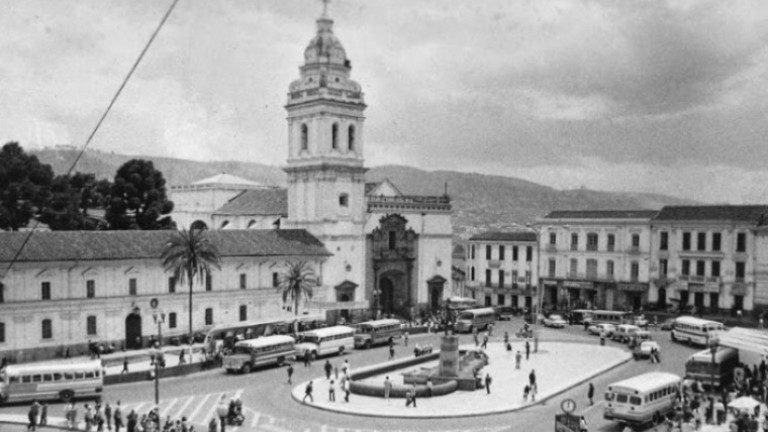

-1

In [0]:
cv2_imshow(img)       #O#

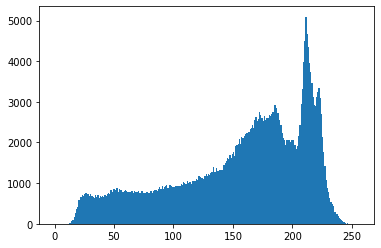

In [0]:
plt.hist(img.ravel(),256,[0,256]); plt.show()   #O#

Here is done the Histogram Equalization

In [0]:
equalizedimage = cv.equalizeHist(img)    #R#

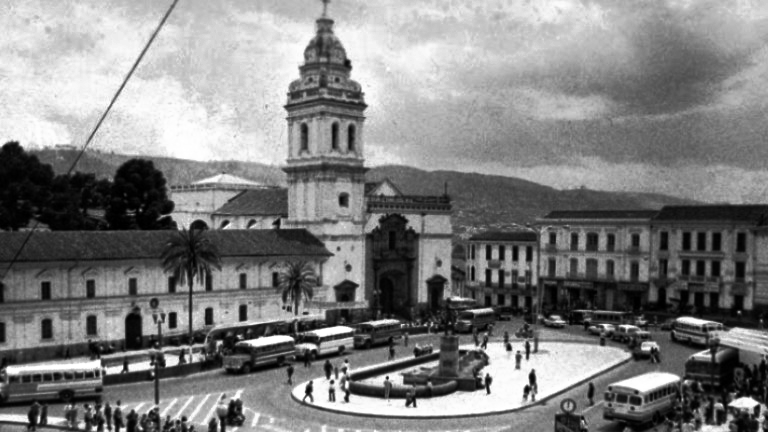

<function waitKey>

In [0]:
cv2_imshow(equalizedimage)      #O#
cv.waitKey

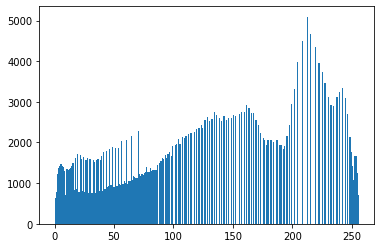

In [0]:
plt.hist(equalizedimage.ravel(),256,[0,256]); plt.show()    #O#

Here is applied the Dynamic Power Law Tranformation

In [0]:
DinamicPowImage = dinamicpow(equalizedimage)    #R#

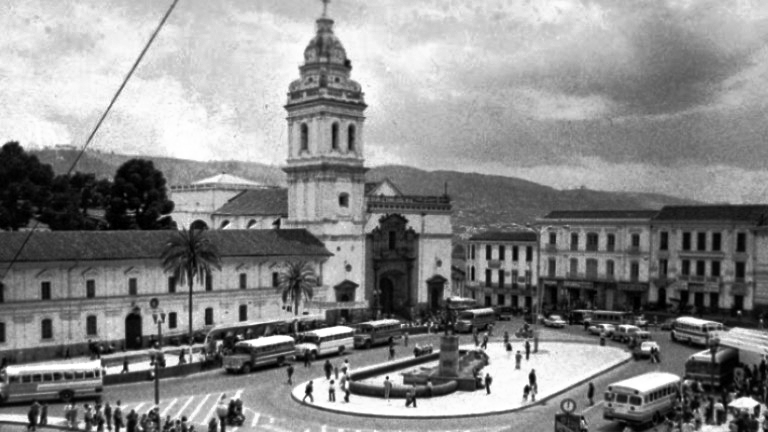

In [0]:
cv.imwrite("/content/Test/test1.png",DinamicPowImage)    #R#
cv2_imshow(DinamicPowImage)

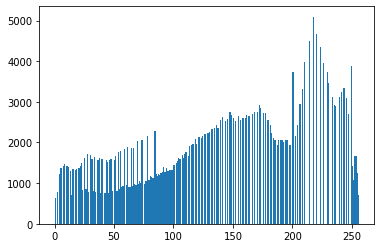

In [0]:
plt.hist(DinamicPowImage.ravel(),256,[0,256]); plt.show()   #O#

# ■ Super High Resolution
In this section is applied the super resolution to the image, the environment is set to work with GPU accelaration. For this step to work properly it is important to follow the next steps:


1.   Open the following link :[Models](https://drive.google.com/drive/u/0/folders/17VYV_SoZZesU6mbxz2dMAIccSSlqLecY)
2.   Make a copy to your unity in Google Drive of the following files:
  *   RRDB_PSNR_x4.pth
  *   RRDB_ESRGAN_x4.pth
3. Once the files are in your unity it is important to rename the files with the original names shown in step 2.
**<font color='#FF000'> IMPORTANT </font>**

If the folder with the models is changed, the rout need to be changed as well in the "net_interp.py" and "test.py" files. 

The result from this section is saved in the <font color='green'>"Results"</font> directory.







In [0]:
cd /content/   

/content


In [0]:
!git clone https://github.com/xinntao/ESRGAN    #P#

Cloning into 'ESRGAN'...
remote: Enumerating objects: 210, done.
remote: Total 210 (delta 0), reused 0 (delta 0), pack-reused 210
Receiving objects: 100% (210/210), 24.85 MiB | 7.62 MiB/s, done.
Resolving deltas: 100% (76/76), done.


In [0]:
cd ESRGAN  


/content/ESRGAN


In [0]:
with open('net_interp.py') as f:            #P#
    lines = f.read().splitlines()
with open('net_interp.py', 'w') as g:
    #line = f.splitlines()
    for line in lines:
      if line.startswith('net_PSNR_path'):
        g.write(line.replace('./models/RRDB_PSNR_x4.pth','/content/drive/My Drive/RRDB_PSNR_x4.pth') + '\n')
      elif line.startswith('net_ESRGAN_path'):
        g.write(line.replace('./models/RRDB_ESRGAN_x4.pth','/content/drive/My Drive/RRDB_ESRGAN_x4.pth') + '\n')
      else:
        g.write(line + '\n')


Here and interpolation between the Original method and a PSNR focussed is done with and interpolation factor of 0.8.

In [0]:
!python net_interp.py 0.8         #P#

Interpolating with alpha =  0.8


In [0]:
with open('test.py') as f:        #P#
    lines = f.read().splitlines()
with open('test.py', 'w') as g:
    #line = f.splitlines()
    for line in lines:
      if line.startswith('model_path'):
        g.write(line.replace('models/RRDB_ESRGAN_x4.pth','/content/ESRGAN/models/interp_08.pth') + '\n')
      elif line.startswith('test_img_folder'):
        g.write(line.replace('LR/*','/content/Test/*') + '\n')  
      else:
        g.write(line + '\n')

In [0]:
with open('test.py') as f:        #P#
    lines = f.read().splitlines()
with open('test.py', 'w') as g:
    #line = f.splitlines()
    for line in lines:
      if line == "    cv2.imwrite('results/{:s}_rlt.png'.format(base), output)":
          g.write(line.replace('results/{:s}_rlt.png','/content/Results/{:s}_rlt.png'))
      else:
        g.write(line + '\n')


 <font color = 'Red'>■ </font>In this cell is where the image is transformed into a HD image

In [0]:
!python test.py    #R#

Model path /content/ESRGAN/models/interp_08.pth. 
Testing...
1 test1


# ■ Prepare Image for Colorizing
In this section Median filter is applied to the image to remove artifacts produced in the previous process, the result of this section is saved in <font color="green">"ToColorize"</font> Directory.

In [0]:
img2 = cv.imread('/content/Results/test1_rlt.png',0)   #R#
img2.shape

(1728, 3072)

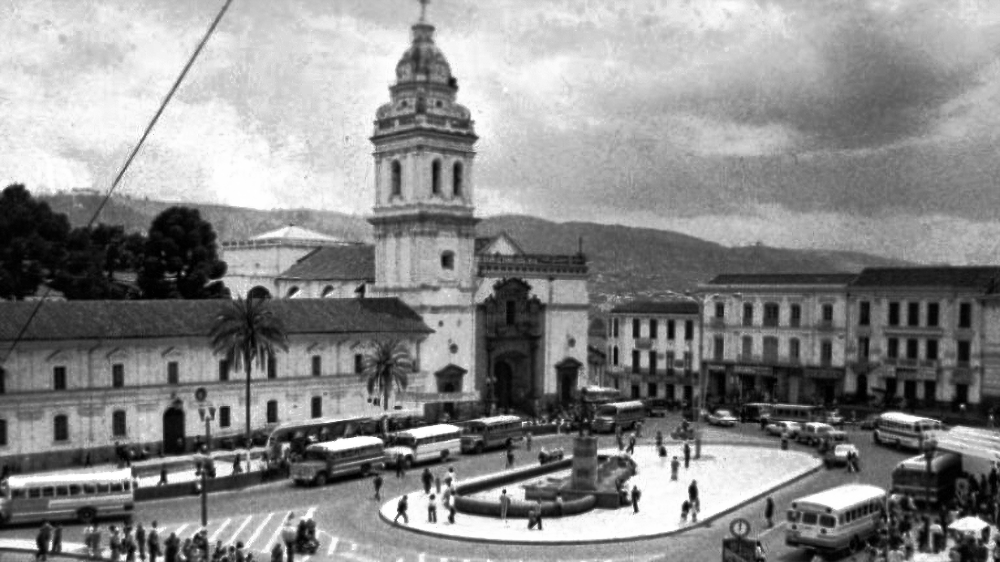

In [0]:
cv2_imshow(img2)    #O#

In [0]:
hdfinal = cv.medianBlur(img2,5)     #R#
cv.imwrite("/content/ToColorize/toColorize1.png",hdfinal)

True

Final result of the resolution augmentation.

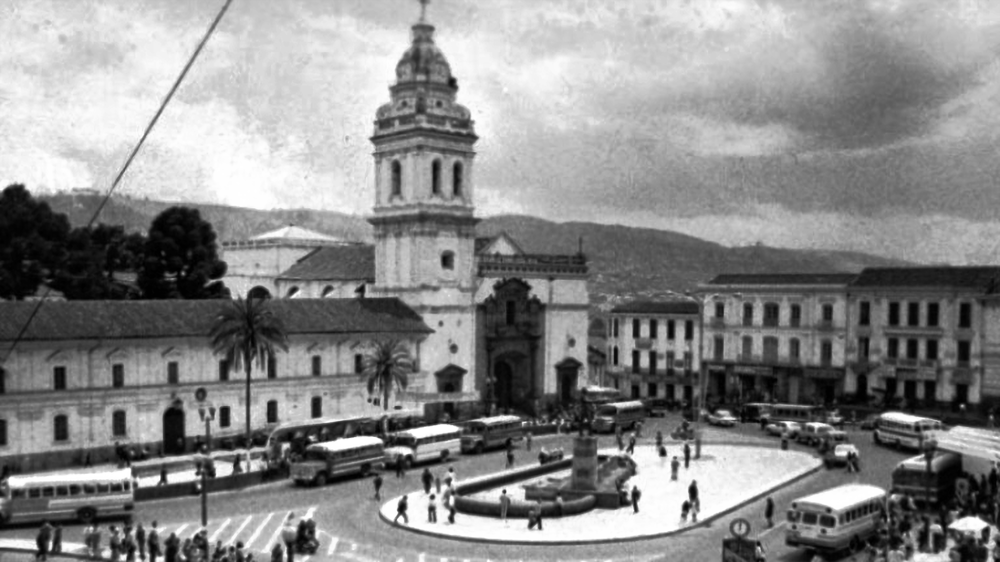

In [0]:
cv2_imshow(hdfinal)     #O#

# ■ Colorizing
In this section is done the colorizing process.
<font color="green">The result is shown as a final output and can be downloaded by right clic and download option.</font>

In [0]:
cd /content/

/content


In [0]:
!git clone https://github.com/jantic/DeOldify.git DeOldify     #P#

Cloning into 'DeOldify'...
remote: Enumerating objects: 3, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 2070 (delta 0), reused 1 (delta 0), pack-reused 2067
Receiving objects: 100% (2070/2070), 69.33 MiB | 10.42 MiB/s, done.
Resolving deltas: 100% (926/926), done.


In [0]:
cd DeOldify

[Errno 2] No such file or directory: 'DeOldify'
/content/DeOldify


In [0]:
from deoldify import device                         #P#
from deoldify.device_id import DeviceId
#choices:  CPU, GPU0...GPU7
device.set(device=DeviceId.GPU0)

import torch

if not torch.cuda.is_available():
    print('GPU not available.')

In [0]:
!pip install -r colab_requirements.txt          #P#

     |████████████████████████████████| 215kB 2.8MB/s 
     |████████████████████████████████| 133kB 8.6MB/s 
     |████████████████████████████████| 1.8MB 8.9MB/s 
     |████████████████████████████████| 7.6MB 20.3MB/s 
     |████████████████████████████████| 61kB 8.1MB/s 
  Created wheel for ffmpeg: filename=ffmpeg-1.4-cp36-none-any.whl size=6084 sha256=6f3791d2703100cacf3bc4c2e291829fdcc68b7d348d3d9d6a3c5cbc313e39ba
  Stored in directory: /root/.cache/pip/wheels/b6/68/c3/a05a35f647ba871e5572b9bbfc0b95fd1c6637a2219f959e7a
Successfully built ffmpeg
  Found existing installation: fastai 1.0.61
    Uninstalling fastai-1.0.61:
      Successfully uninstalled fastai-1.0.61
  Found existing installation: jsonschema 2.6.0
    Uninstalling jsonschema-2.6.0:
      Successfully uninstalled jsonschema-2.6.0


In [0]:
import fastai                         #P#
from deoldify.visualize import *

In [0]:
!mkdir 'models'               #P#
!wget https://www.dropbox.com/s/zkehq1uwahhbc2o/ColorizeArtistic_gen.pth?dl=0 -O ./models/ColorizeArtistic_gen.pth

--2020-05-25 17:59:09--  https://www.dropbox.com/s/zkehq1uwahhbc2o/ColorizeArtistic_gen.pth?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.82.1, 2620:100:6032:1::a27d:5201
Connecting to www.dropbox.com (www.dropbox.com)|162.125.82.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/zkehq1uwahhbc2o/ColorizeArtistic_gen.pth [following]
--2020-05-25 17:59:10--  https://www.dropbox.com/s/raw/zkehq1uwahhbc2o/ColorizeArtistic_gen.pth
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc5c33e1c454a5a9fd4636fc173d.dl.dropboxusercontent.com/cd/0/inline/A4ZtSev-shvbtHhPn8Pnc2K7D8fMet_mA02_4uJTCa8W3aT13iVIHiUPKO0iI35_CpNYhdr6G0yrPfrUUXA-S0iUzTnM_4kFpQf-65tsMidEhw/file# [following]
--2020-05-25 17:59:10--  https://uc5c33e1c454a5a9fd4636fc173d.dl.dropboxusercontent.com/cd/0/inline/A4ZtSev-shvbtHhPn8Pnc2K7D8fMet_mA02_4uJTCa8W3aT13iVIHiUPKO0iI35_CpNYhdr6G0yrPfrUUXA-S0iUzTn

In [0]:
#P#
!wget https://media.githubusercontent.com/media/jantic/DeOldify/master/resource_images/watermark.png -O ./resource_images/watermark.png

--2020-05-25 18:00:36--  https://media.githubusercontent.com/media/jantic/DeOldify/master/resource_images/watermark.png
Resolving media.githubusercontent.com (media.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9210 (9.0K) [image/png]
Saving to: ‘./resource_images/watermark.png’

./resource_images/w 100%[===================>]   8.99K  --.-KB/s    in 0s      

2020-05-25 18:00:36 (75.1 MB/s) - ‘./resource_images/watermark.png’ saved [9210/9210]



In [0]:
colorizer = get_artistic_image_colorizer()    #P#

/usr/local/lib/python3.6/dist-packages/fastai/data_block.py:442: UserWarning: Your training set is empty. If this is by design, pass `ignore_empty=True` to remove this warning.
  warn("Your training set is empty. If this is by design, pass `ignore_empty=True` to remove this warning.")
/usr/local/lib/python3.6/dist-packages/fastai/data_block.py:445: UserWarning: Your validation set is empty. If this is by design, use `split_none()`
                 or pass `ignore_empty=True` when labelling to remove this warning.
  or pass `ignore_empty=True` when labelling to remove this warning.""")
Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth


 <font color = 'Red'>■ </font>Here is where the colorizing process is done. 

The render factor can be changed at convenience, from 1 to 40.
Post-processing and watermark are optional.

**<font color='#FF000'> NOTE </font>**

Watermark is used in pictures where AI take part, by allowing the watermatk you support the AI movement.


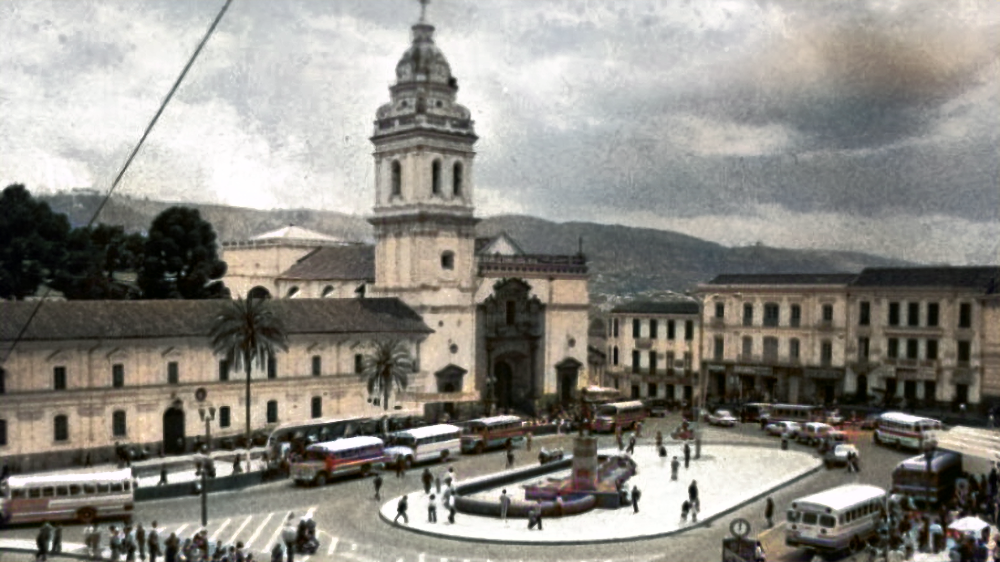

In [0]:
render_factor = 35
Post_processing = True
Watermark = False
#colorizer.result_folder = Path('/content/FinalResults')
colorizer.get_transformed_image(Path('/content/ToColorize/toColorize1.png'),render_factor,Post_processing,Watermark)